# Training Custom ResNet
___

## Table of contents
1. [Imports](#Imports)
2. [LoadData](#LoadData)
3. [Config](#Configs)
4. [Analysis](#Analysis)
5. [Process](#Process)

## Imports

In [1]:
import os
import numpy as np
import pandas as pd

import optuna
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset,DataLoader,random_split
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import models, transforms
from torch_lr_finder import LRFinder

from tqdm.notebook import tqdm

import math
import pretrainedmodels as ptm
import h5py
import copy
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:
from Library.datasets import DatasetH5TwoRandom, DatasetH5ForTest, compute_std_mean
from Library.transforms import RandomFlip,RandomOffset,RandomRotateGrayscale
from Library.scheduler import OneCycleLR,LogLR
from Library.cresnet import initialize_cresnet
from Library.dml import RefBasedDeepMetric
from Library.models.FeatureExtractor import FeatureExtractor, Block, CustomNet
from Library.trainers import RefBasedDeepMetricTrainer

In [3]:
from Library.util import (
    jupyter_wide_screen,
    strings_contain_words, 
    strings_contain_patterns, 
    add_unique_entry
)

jupyter_wide_screen()

## LoadData

#### To initialize dataset: obtain References and Dataset object

In [4]:
#### To initialize dataset: obtain References and Dataset object
def init_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []
    
    ### 可能还需要用 transforms.RandomHorizontalFlip()  RandomRotate
    #img_transforms = [transforms.ToTensor(),transforms.Normalize((mean_val,),(std_val,))] # 先标准化处理
    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5TwoRandom(h5_fpath,transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [5]:
# 1 stripe
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "trueroi_filtered_phase2_1_{}.h5" # 2,3,4
combined_path_type2 = os.path.join(data_path_type2, fnames_type2)
seq_idx_list_type2 = [2,3,4]

inputs_shape = [1,720,24]
batch_sizes = [32, 32, 32]
shuffle_flags = [True, False, False]
ds_ratio = [0.6, 0.2, 0.2]

In [6]:
mean_val = 0
std_val = 255
refs_list, ds_h5 = init_dataset(combined_path_type2, seq_idx_list_type2, mean_val, std_val)

In [7]:
len(refs_list)

3

#### Dataloader for training set ,validation set, test set (60%,20%,20%)

In [8]:
def init_dataloaders(datasets,ds_ratio):
    dataloaders = []
    
    for ds in datasets:
        splitted_ds_num_data = [round(len(ds) * ds_ratio[i]) for i in range(len(ds_ratio))]
        splitted_ds_num_data[0] += len(ds) - int(np.sum(splitted_ds_num_data))

        splitted_ds = []

        for tmp_ds, batch_size, shuffle in zip(random_split(ds, splitted_ds_num_data), batch_sizes, shuffle_flags):

            splitted_ds.append(
                DataLoader(
                    tmp_ds,
                    batch_size=batch_size,
                    shuffle=shuffle,
                    drop_last=True,
                )
            )

        dataloaders.append(splitted_ds)
    return dataloaders

In [9]:
dataloaders = init_dataloaders(ds_h5, ds_ratio)

train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]
test_dls = [dls[2] for dls in dataloaders]

## FeatureExtractor Load optuna

In [27]:
model_path = 'optuna_models/RefFreeDeepMetric_Model_v6_old_3stride'

In [28]:
with open(os.path.join(model_path, 'config.json')) as f:
    cresnet_config = json.load(f)
    
weight_fpath = os.path.join(model_path, 'model.weight')

device = torch.device("cuda:0")

In [29]:
cresnet_config

{'loss_non_linearity_name': 'sigmoid',
 'criterion_name': 'bce',
 'cresnet_config': {'InputShape': [1, 720, 30],
  'BlockName': 'leakybottleneck',
  'NumBlocks': [1, 1, 1, 1, 1, 1],
  'NumChannels': [8, 8, 16, 16, 32, 32],
  'Strides': [[2, 2], [2, 2], [2, 1], [2, 1], [2, 2], [2, 2]],
  'NumNeurons': [128],
  'EnableGlobalAveragePooling': True,
  'PrintIntermediateShape': False,
  'InitializeResidual': True}}

In [50]:
model = RefBasedDeepMetric.load_pretrained_cresnet(model_path, device, show_config=True)

{'loss_non_linearity_name': 'sigmoid', 'criterion_name': 'bce', 'cresnet_config': {'InputShape': [1, 720, 30], 'BlockName': 'leakybottleneck', 'NumBlocks': [1, 1, 1, 1, 1, 1], 'NumChannels': [8, 8, 16, 16, 32, 32], 'Strides': [[2, 2], [2, 2], [2, 1], [2, 1], [2, 2], [2, 2]], 'NumNeurons': [128], 'EnableGlobalAveragePooling': True, 'PrintIntermediateShape': False, 'InitializeResidual': True}}


In [51]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

RefBasedDeepMetric(
  (feature_extractor): CResNet(
    (Block0): Sequential(
      (0): LeakyBottleneck(
        (conv1): Conv2d(1, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(8, 8, kernel_size=(3, 3), stride=[2, 2], padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): LeakyReLU(negative_slope=0.01, inplace=True)
        (downsample): Sequential(
          (0): Conv2d(1, 32, kernel_size=(1, 1), stride=[2, 2], bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
    )
    (Block1): Sequential(
      (0): LeakyBottleneck(
        (conv1): Co

## SiameseNet structure

#### Load pretrained ResNet

In [ ]:
res_model = models.resnet34(pretrained=True)
feature_extractor = FeatureExtractor(res_model)
model = RefBasedDeepMetric(feature_extractor,loss_non_linearity_name='sigmoid',criterion_name='bce',)
#model = SiameseNet(feature_extractor)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

AttributeError: 'CResNet' object has no attribute 'show_intermediate_shape'

## Learning Rate Test

In [40]:
from torch.optim.lr_scheduler import _LRScheduler
from torch_lr_finder import LRFinder ,TrainDataLoaderIter, ValDataLoaderIter

In [41]:
class CustomTrainIter(TrainDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels
    
    def __next__(self):
        try:
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)
        except StopIteration:
            if not self.auto_reset:
                raise
            self._iterator = iter(self.data_loader)
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)

        return img1, img2, labels

In [42]:
class CustomValIter(ValDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels

In [43]:
class LinearLR(_LRScheduler):
    """Linearly increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(LinearLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr + r * (self.end_lr - base_lr) for base_lr in self.base_lrs]

In [44]:
class ExponentialLR(_LRScheduler):
    """Exponentially increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        # In earlier Pytorch versions last_epoch starts at -1, while in recent versions
        # it starts at 0. We need to adjust the math a bit to handle this. See
        # discussion at: https://github.com/davidtvs/pytorch-lr-finder/pull/42
        
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

In [52]:
try:
    from apex import amp

    IS_AMP_AVAILABLE = True
except ImportError:
    IS_AMP_AVAILABLE = False
    
class CustomLRFinder(LRFinder):
    
    def custom_range_test(
        self,
        train_loader,
        curr_refs,
        val_loader=None,
        start_lr=None,
        end_lr=10,
        num_iter=100,
        step_mode="exp",
        smooth_f=0.05,
        diverge_th=5,
        accumulation_steps=1,
        non_blocking_transfer=True,
    ):
       
        # Reset test results
        self.history = {"lr": [], "loss": []}
        self.best_loss = None

        # Move the model to the proper device
        self.model.to(self.device)

        # Check if the optimizer is already attached to a scheduler
        self._check_for_scheduler()

        # Set the starting learning rate
        if start_lr:
            self._set_learning_rate(start_lr)

        # Initialize the proper learning rate policy
        if step_mode.lower() == "exp":
            lr_schedule = ExponentialLR(self.optimizer, end_lr, num_iter)
        elif step_mode.lower() == "linear":
            lr_schedule = LinearLR(self.optimizer, end_lr, num_iter)
        else:
            raise ValueError("expected one of (exp, linear), got {}".format(step_mode))

        if smooth_f < 0 or smooth_f >= 1:
            raise ValueError("smooth_f is outside the range [0, 1[")

        # Create an iterator to get data batch by batch
        if isinstance(train_loader, DataLoader):
            train_iter = TrainDataLoaderIter(train_loader)
        elif isinstance(train_loader, TrainDataLoaderIter):
            train_iter = train_loader
        else:
            raise ValueError(
                "`train_loader` has unsupported type: {}."
                "Expected types are `torch.utils.data.DataLoader`"
                "or child of `TrainDataLoaderIter`.".format(type(train_loader))
            )

        if val_loader:
            if isinstance(val_loader, DataLoader):
                val_iter = CustomValIter(val_loader)
            elif isinstance(val_loader, ValDataLoaderIter):
                val_iter = val_loader
            else:
                raise ValueError(
                    "`val_loader` has unsupported type: {}."
                    "Expected types are `torch.utils.data.DataLoader`"
                    "or child of `ValDataLoaderIter`.".format(type(val_loader))
                )

        for iteration in tqdm(range(num_iter)):
            # Train on batch and retrieve loss
            loss = self._train_batch(
                train_iter,
                curr_refs,
                accumulation_steps,
                non_blocking_transfer= non_blocking_transfer,
            )
            if val_loader:
                loss = self._validate(
                    val_iter, curr_refs, non_blocking_transfer=non_blocking_transfer
                )

            # Update the learning rate
            self.history["lr"].append(lr_schedule.get_lr()[0])
            lr_schedule.step()

            # Track the best loss and smooth it if smooth_f is specified
            if iteration == 0:
                self.best_loss = loss
            else:
                if smooth_f > 0:
                    loss = smooth_f * loss + (1 - smooth_f) * self.history["loss"][-1]
                if loss < self.best_loss:
                    self.best_loss = loss

            # Check if the loss has diverged; if it has, stop the test
            self.history["loss"].append(loss)
            if loss > diverge_th * self.best_loss:
                print("Stopping early, the loss has diverged")
                break

        print("Learning rate search finished. See the graph with {finder_name}.plot()")

    def _train_batch(self, train_iter, curr_refs, accumulation_steps, non_blocking_transfer=True):
        self.model.train()
        total_loss = None  # for late initialization
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.optimizer.zero_grad()
        curr_refs = curr_refs.float().to(device)

        for i in range(accumulation_steps):
            img1, img2, labels = next(train_iter)
            labels = labels.view(-1)
            labels = labels.to(device)
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)

            # Forward pass
            loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)

            # Loss should be averaged in each step
            loss /= accumulation_steps

            # Backward pass
            if IS_AMP_AVAILABLE and hasattr(self.optimizer, "_amp_stash"):
                # For minor performance optimization, see also:
                # https://nvidia.github.io/apex/advanced.html#gradient-accumulation-across-iterations
                delay_unscale = ((i + 1) % accumulation_steps) != 0

                with amp.scale_loss(
                    loss, self.optimizer, delay_unscale=delay_unscale
                ) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if total_loss is None:
                total_loss = loss
            else:
                total_loss += loss

        self.optimizer.step()

        return total_loss.item()
    
    def _validate(self, val_iter, curr_refs, non_blocking_transfer=True):
        # Set model to evaluation mode and disable gradient computation
        running_loss = 0
        self.model.eval()
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        curr_refs = curr_refs.float().to(device)
        with torch.no_grad():
            for img1, img2, labels in val_iter:
                # Move data to the correct device
                labels = labels.view(-1)
                labels = labels.to(device)
                img1 = img1.float().to(device)
                img2 = img2.float().to(device)

                # Forward pass and loss computation
                loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)
                running_loss += loss.item() * len(labels)

        return running_loss / len(val_iter.dataset)
    

### LR Test Config

In [53]:
start_lr = 1e-8
end_lr = 1

min_lr_factor   = 0.2
anneal_lr_factor= 1e-1

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2
refs_dl_idx = 0

optimizer = torch.optim.Adam(model.parameters(),lr=start_lr, eps=1e-08, weight_decay=0)
#optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, momentum=0.5)
#criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss(reduction = 'none')
criterion = nn.BCELoss()


Learning rate search finished. See the graph with {finder_name}.plot()


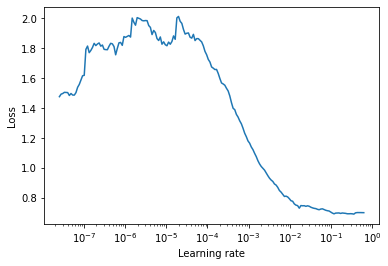

In [54]:
lr_finder.reset()
lr_finder = CustomLRFinder(model, optimizer, criterion, device="cuda")

# seq dataloader / shuffel the dataloader
for refs, train_dl, val_dl in zip (refs_list, train_dls, valid_dls):
    custom_train_iter = CustomTrainIter(train_dl)
    custom_val_iter = CustomValIter(val_dl)
lr_finder.custom_range_test(custom_train_iter, curr_refs = refs, end_lr=end_lr, num_iter=200)
lr_finder.plot(suggest_lr= False)
lr_finder.reset()

## Training Config

In [55]:
num_epochs = 30

lr = 3e-3

min_lr_factor = 0.1
phases_ratio = [0.3, 0.2, 0.3, 0.2]

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2

run_train = True

net_path = "../MA/save_net/"
criterion = nn.BCELoss()
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print('Current Timestamp : ', timestampStr)

Current Timestamp :  27-May-2021 (12:26:59)


Total Train Iterations:  530
Total Train Iterations List:  [149, 230, 530]
Valid iterations per seq:  [49, 27, 100]


Train



Sequence:1, Seq Training Mean Loss: 0.7709677543416119, Seq Training Acc: 0.5388003355704698
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6997108474189853, Seq Training Acc: 0.5478395061728395
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4848566012084484, Seq Training Acc: 0.7553125
******************************************************************
Epoch:1, Epoch Training Loss Mean: 0.5981278419494629, Epoch Training Acc: 0.6627358490566038
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7080970637652338, Seq Valid Acc: 0.5376275510204082



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7414937571243003, Seq Valid Acc: 0.5115740740740741



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4216596329212189, Seq Valid Acc: 0.816875
Epoch:1, Epoch Valid Mean Loss: 0.550471842288971, Epoch Valid Acc: 0.6922940340909091
******************************************************************


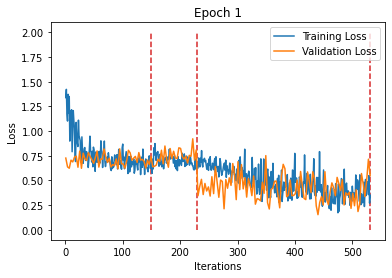

Train



Sequence:1, Seq Training Mean Loss: 0.6342633908627017, Seq Training Acc: 0.636744966442953
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.676612240296823, Seq Training Acc: 0.591820987654321
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3887650898595651, Seq Training Acc: 0.8288541666666667
******************************************************************
Epoch:2, Epoch Training Loss Mean: 0.501774251461029, Epoch Training Acc: 0.738620283018868
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6735503807359812, Seq Valid Acc: 0.6128826530612245



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6876077740280716, Seq Valid Acc: 0.6111111111111112



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.37357003793120386, Seq Valid Acc: 0.8353125
Epoch:2, Epoch Valid Mean Loss: 0.5052635073661804, Epoch Valid Acc: 0.7389914772727273
******************************************************************


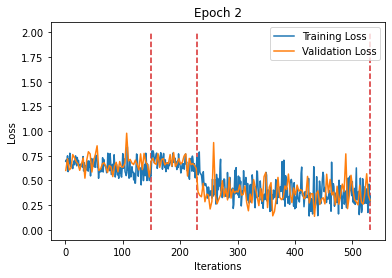

Train



Sequence:1, Seq Training Mean Loss: 0.5798200000852547, Seq Training Acc: 0.6931627516778524
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6225250963075661, Seq Training Acc: 0.6597222222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3433523049702247, Seq Training Acc: 0.8521875
******************************************************************
Epoch:3, Epoch Training Loss Mean: 0.4524969756603241, Epoch Training Acc: 0.778066037735849
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.9586160146460241, Seq Valid Acc: 0.6313775510204082



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.8276005895049484, Seq Valid Acc: 0.5787037037037037



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.3307767549157143, Seq Valid Acc: 0.865
Epoch:3, Epoch Valid Mean Loss: 0.5817902088165283, Epoch Valid Acc: 0.7560369318181818
******************************************************************


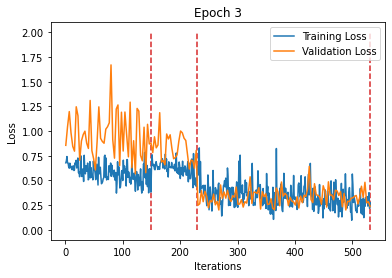

Train



Sequence:1, Seq Training Mean Loss: 0.5248423352737555, Seq Training Acc: 0.7489513422818792
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.6083423256138225, Seq Training Acc: 0.6890432098765432
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.31185126575330896, Seq Training Acc: 0.860625
******************************************************************
Epoch:4, Epoch Training Loss Mean: 0.41704267263412476, Epoch Training Acc: 0.8030070754716981
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7608419395222956, Seq Valid Acc: 0.6511479591836735



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.844274326607033, Seq Valid Acc: 0.5543981481481481



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.2486462289094925, Seq Valid Acc: 0.89375
Epoch:4, Epoch Valid Mean Loss: 0.4826209843158722, Epoch Valid Acc: 0.7741477272727273
******************************************************************


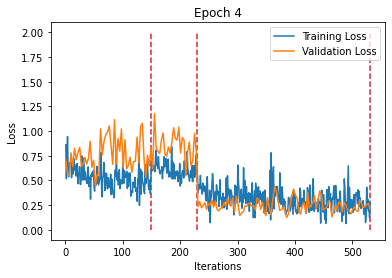

Train



Sequence:1, Seq Training Mean Loss: 0.48114638740584353, Seq Training Acc: 0.7825083892617449
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5589477416173911, Seq Training Acc: 0.7199074074074074
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2749560816213489, Seq Training Acc: 0.88
******************************************************************
Epoch:5, Epoch Training Loss Mean: 0.3763253092765808, Epoch Training Acc: 0.828125
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5450012775100007, Seq Valid Acc: 0.7595663265306123



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5785446553318588, Seq Valid Acc: 0.7118055555555556



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.236543535515666, Seq Valid Acc: 0.8978125
Epoch:5, Epoch Valid Mean Loss: 0.37488701939582825, Epoch Valid Acc: 0.8307883522727273
******************************************************************


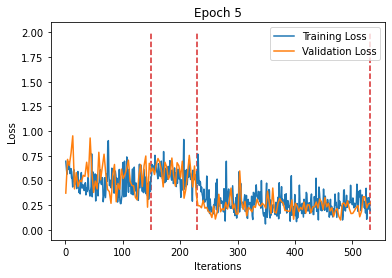

Train



Sequence:1, Seq Training Mean Loss: 0.4476136975740426, Seq Training Acc: 0.7986577181208053
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5152244899008009, Seq Training Acc: 0.7511574074074074
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.25679443787783385, Seq Training Acc: 0.8860416666666666
******************************************************************
Epoch:6, Epoch Training Loss Mean: 0.34993574023246765, Epoch Training Acc: 0.8408608490566037
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.4642795299997135, Seq Valid Acc: 0.7933673469387755



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5662619151450969, Seq Valid Acc: 0.7164351851851852



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.22628649674355983, Seq Valid Acc: 0.9053125
Epoch:6, Epoch Valid Mean Loss: 0.34470126032829285, Epoch Valid Acc: 0.8451704545454546
******************************************************************


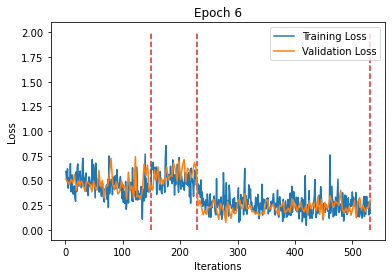

Train



Sequence:1, Seq Training Mean Loss: 0.4281855690599288, Seq Training Acc: 0.8104026845637584
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4859300121481036, Seq Training Acc: 0.7692901234567902
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2607678284744422, Seq Training Acc: 0.8863541666666667
******************************************************************
Epoch:7, Epoch Training Loss Mean: 0.342245876789093, Epoch Training Acc: 0.8471108490566037
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5896330597449322, Seq Valid Acc: 0.7385204081632653



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6273884265511124, Seq Valid Acc: 0.7060185185185185



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.2589206126332283, Seq Valid Acc: 0.8790625
Epoch:7, Epoch Valid Mean Loss: 0.4075202941894531, Epoch Valid Acc: 0.8133877840909091
******************************************************************


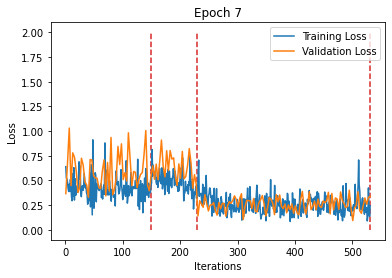

Train



Sequence:1, Seq Training Mean Loss: 0.40760789371576883, Seq Training Acc: 0.8106124161073825
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4611057694311495, Seq Training Acc: 0.7916666666666666
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2500646109382311, Seq Training Acc: 0.889375
******************************************************************
Epoch:8, Epoch Training Loss Mean: 0.3266085386276245, Epoch Training Acc: 0.8522995283018868
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.475713282215352, Seq Valid Acc: 0.7793367346938775



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5603340930408902, Seq Valid Acc: 0.71875



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.26072396263480185, Seq Valid Acc: 0.9125
Epoch:8, Epoch Valid Mean Loss: 0.36654186248779297, Epoch Valid Acc: 0.845703125
******************************************************************


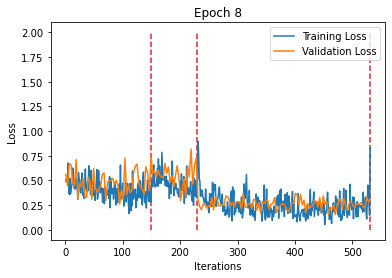

Train



Sequence:1, Seq Training Mean Loss: 0.41602197749502706, Seq Training Acc: 0.8177432885906041
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.47759626161904983, Seq Training Acc: 0.7727623456790124
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.23884518937518198, Seq Training Acc: 0.896875
******************************************************************
Epoch:9, Epoch Training Loss Mean: 0.32514363527297974, Epoch Training Acc: 0.8556603773584905
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7304942236871136, Seq Valid Acc: 0.7417091836734694



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5732431842221154, Seq Valid Acc: 0.7314814814814815



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.21140209876000882, Seq Valid Acc: 0.904375
Epoch:9, Epoch Valid Mean Loss: 0.41143178939819336, Epoch Valid Acc: 0.8325639204545454
******************************************************************


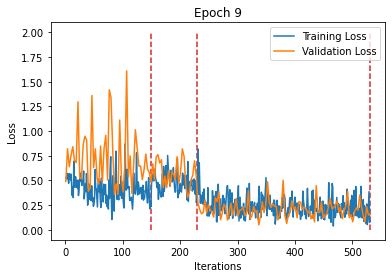

Train



Sequence:1, Seq Training Mean Loss: 0.3830215118375401, Seq Training Acc: 0.834731543624161
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4660962661843241, Seq Training Acc: 0.7862654320987654
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.21658020090932648, Seq Training Acc: 0.9076041666666667
******************************************************************
Epoch:10, Epoch Training Loss Mean: 0.30150577425956726, Epoch Training Acc: 0.8685731132075472
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.8805048386661374, Seq Valid Acc: 0.7123724489795918



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7770080632633634, Seq Valid Acc: 0.7013888888888888



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.2315257555246353, Seq Valid Acc: 0.9025
Epoch:10, Epoch Valid Mean Loss: 0.4958893656730652, Epoch Valid Acc: 0.8187144886363636
******************************************************************


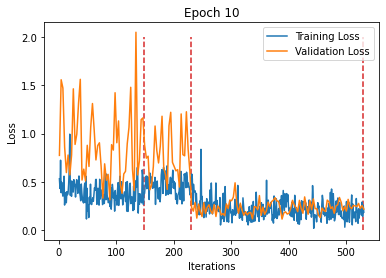

Train



Sequence:1, Seq Training Mean Loss: 0.3673316771352051, Seq Training Acc: 0.8431208053691275
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.45334009807786824, Seq Training Acc: 0.7866512345679012
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2342766575391094, Seq Training Acc: 0.9008333333333334
******************************************************************
Epoch:11, Epoch Training Loss Mean: 0.3051621913909912, Epoch Training Acc: 0.8671580188679245
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.708040152885476, Seq Valid Acc: 0.7372448979591837



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6566786655673275, Seq Valid Acc: 0.6990740740740741



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.20338178500533105, Seq Valid Acc: 0.9190625
Epoch:11, Epoch Valid Mean Loss: 0.413423091173172, Epoch Valid Acc: 0.8346946022727273
******************************************************************


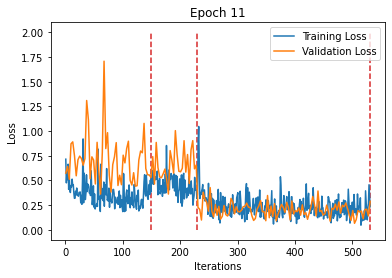

Train



Sequence:1, Seq Training Mean Loss: 0.36693436157383374, Seq Training Acc: 0.8399748322147651
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4233433068902404, Seq Training Acc: 0.8032407407407407
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.21819018098215262, Seq Training Acc: 0.9048958333333333
******************************************************************
Epoch:12, Epoch Training Loss Mean: 0.2913605272769928, Epoch Training Acc: 0.8711084905660378
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5959115283829826, Seq Valid Acc: 0.7767857142857143



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5905935653933773, Seq Valid Acc: 0.7476851851851852



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1923066658899188, Seq Valid Acc: 0.9084375
Epoch:12, Epoch Valid Mean Loss: 0.3657747507095337, Epoch Valid Acc: 0.8471235795454546
******************************************************************


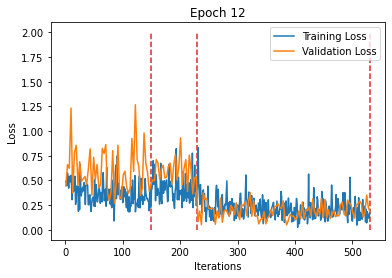

Train



Sequence:1, Seq Training Mean Loss: 0.3526434898376465, Seq Training Acc: 0.8424916107382551
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4424226271149553, Seq Training Acc: 0.7943672839506173
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.21053253629555305, Seq Training Acc: 0.913125
******************************************************************
Epoch:13, Epoch Training Loss Mean: 0.2859243154525757, Epoch Training Acc: 0.8751179245283018
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6896945779420891, Seq Valid Acc: 0.7321428571428571



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6885603511774981, Seq Valid Acc: 0.7025462962962963



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.22171204805374145, Seq Valid Acc: 0.9159375
Epoch:13, Epoch Valid Mean Loss: 0.42362138628959656, Epoch Valid Acc: 0.83203125
******************************************************************


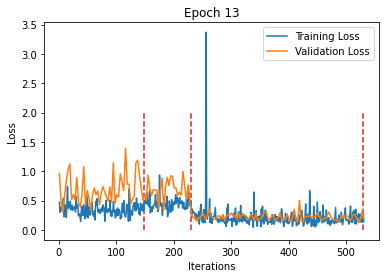

Train



Sequence:1, Seq Training Mean Loss: 0.3469208243909298, Seq Training Acc: 0.8519295302013423
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4163421363006403, Seq Training Acc: 0.8055555555555556
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.20236754794294634, Seq Training Acc: 0.9140625
******************************************************************
Epoch:14, Epoch Training Loss Mean: 0.2757079005241394, Epoch Training Acc: 0.8800117924528302
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 1.2722943300495342, Seq Valid Acc: 0.7716836734693877



******************************************************************
Sequence:2, Seq Valid Mean Loss: 1.3448665738105774, Seq Valid Acc: 0.6898148148148148



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1911037604510784, Seq Valid Acc: 0.9246875
Epoch:14, Epoch Valid Mean Loss: 0.6691147685050964, Epoch Valid Acc: 0.8460582386363636
******************************************************************


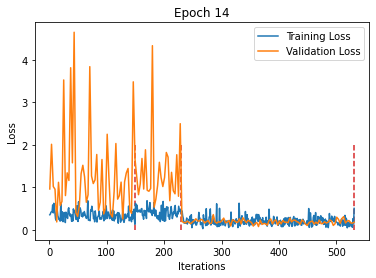

Train



Sequence:1, Seq Training Mean Loss: 0.36069414539625183, Seq Training Acc: 0.8422818791946308
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4035840453924956, Seq Training Acc: 0.8155864197530864
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.19651967792461317, Seq Training Acc: 0.9151041666666667
******************************************************************
Epoch:15, Epoch Training Loss Mean: 0.2743200659751892, Epoch Training Acc: 0.8794221698113207
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 1.0192289413238058, Seq Valid Acc: 0.8176020408163265



******************************************************************
Sequence:2, Seq Valid Mean Loss: 1.0481575021037348, Seq Valid Acc: 0.78125



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.21369226284325124, Seq Valid Acc: 0.91125
Epoch:15, Epoch Valid Mean Loss: 0.565975546836853, Epoch Valid Acc: 0.865234375
******************************************************************


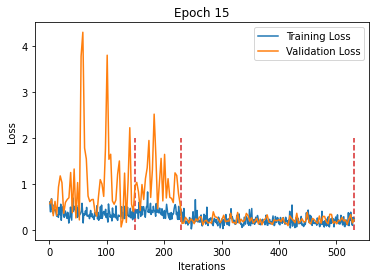

Train



Sequence:1, Seq Training Mean Loss: 0.35656111727424916, Seq Training Acc: 0.8435402684563759
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.407007791193915, Seq Training Acc: 0.8121141975308642
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.18682433874035875, Seq Training Acc: 0.9169791666666667
******************************************************************
Epoch:16, Epoch Training Loss Mean: 0.26819345355033875, Epoch Training Acc: 0.8803066037735849
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6404915123569722, Seq Valid Acc: 0.7799744897959183



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7149542581152033, Seq Valid Acc: 0.7314814814814815



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.2477934467792511, Seq Valid Acc: 0.91
Epoch:16, Epoch Valid Mean Loss: 0.4287908673286438, Epoch Valid Acc: 0.8464133522727273
******************************************************************


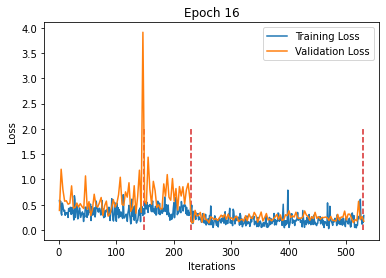

Train



Sequence:1, Seq Training Mean Loss: 0.3370990208131355, Seq Training Acc: 0.8536073825503355
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.39027646404725536, Seq Training Acc: 0.8229166666666666
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.19645888776828846, Seq Training Acc: 0.9125
******************************************************************
Epoch:17, Epoch Training Loss Mean: 0.2656185030937195, Epoch Training Acc: 0.882252358490566
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5965232839997934, Seq Valid Acc: 0.8010204081632653



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5732749689508367, Seq Valid Acc: 0.7731481481481481



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.21391060158610345, Seq Valid Acc: 0.9190625
Epoch:17, Epoch Valid Mean Loss: 0.3755631744861603, Epoch Valid Acc: 0.8638139204545454
******************************************************************


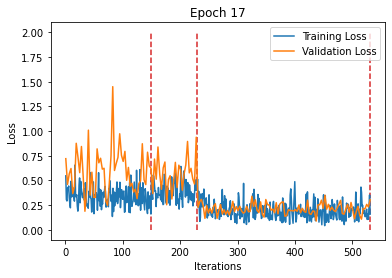

Train



Sequence:1, Seq Training Mean Loss: 0.32209329372084383, Seq Training Acc: 0.8575922818791947
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.39757495161927775, Seq Training Acc: 0.8229166666666666
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.17764905302474895, Seq Training Acc: 0.9239583333333333
******************************************************************
Epoch:18, Epoch Training Loss Mean: 0.25186827778816223, Epoch Training Acc: 0.8898584905660377
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5548312125765548, Seq Valid Acc: 0.8061224489795918



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6659417687742798, Seq Valid Acc: 0.7696759259259259



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.23005364060401917, Seq Valid Acc: 0.923125
Epoch:18, Epoch Valid Mean Loss: 0.3873438835144043, Epoch Valid Acc: 0.8670099431818182
******************************************************************


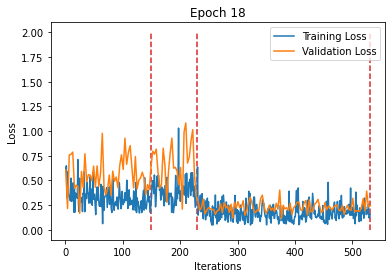

Train



Sequence:1, Seq Training Mean Loss: 0.3257884294194663, Seq Training Acc: 0.8578020134228188
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.38693556042365085, Seq Training Acc: 0.8206018518518519
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.1742108915032198, Seq Training Acc: 0.9260416666666667
******************************************************************
Epoch:19, Epoch Training Loss Mean: 0.24933494627475739, Epoch Training Acc: 0.8907429245283018
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 1.1805455757647145, Seq Valid Acc: 0.7882653061224489



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7625661492347717, Seq Valid Acc: 0.75



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.17974879018962384, Seq Valid Acc: 0.933125
Epoch:19, Epoch Valid Mean Loss: 0.5477891564369202, Epoch Valid Acc: 0.8647017045454546
******************************************************************


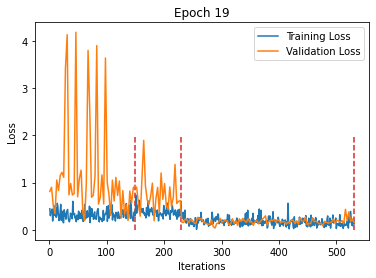

Train



Sequence:1, Seq Training Mean Loss: 0.3116801781142318, Seq Training Acc: 0.8634647651006712
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.35765327844354844, Seq Training Acc: 0.8321759259259259
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.1687637328977386, Seq Training Acc: 0.92625
******************************************************************
Epoch:20, Epoch Training Loss Mean: 0.2378101497888565, Epoch Training Acc: 0.8942216981132075
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 1.4219251442320493, Seq Valid Acc: 0.8061224489795918



******************************************************************
Sequence:2, Seq Valid Mean Loss: 1.9417887848836404, Seq Valid Acc: 0.7430555555555556



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.17556447759270669, Seq Valid Acc: 0.930625
Epoch:20, Epoch Valid Mean Loss: 0.7935174703598022, Epoch Valid Acc: 0.8671875
******************************************************************


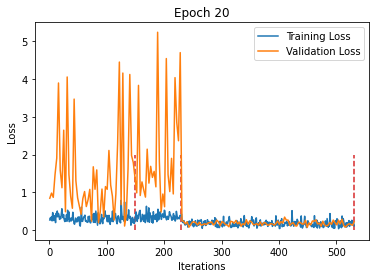

Train



Sequence:1, Seq Training Mean Loss: 0.2913447452971599, Seq Training Acc: 0.8762583892617449
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.35749200814300114, Seq Training Acc: 0.8445216049382716
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.15174002771576245, Seq Training Acc: 0.9353125
******************************************************************
Epoch:21, Epoch Training Loss Mean: 0.22243249416351318, Epoch Training Acc: 0.9048349056603774
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5942609097276416, Seq Valid Acc: 0.8144132653061225



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6412203709284464, Seq Valid Acc: 0.7638888888888888



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1669791306182742, Seq Valid Acc: 0.93125
Epoch:21, Epoch Valid Mean Loss: 0.35869118571281433, Epoch Valid Acc: 0.873046875
******************************************************************


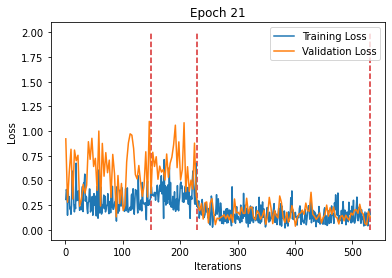

Train



Sequence:1, Seq Training Mean Loss: 0.2913090885685594, Seq Training Acc: 0.8739513422818792
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.35716306537757686, Seq Training Acc: 0.8364197530864198
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.14919004804144304, Seq Training Acc: 0.934375
******************************************************************
Epoch:22, Epoch Training Loss Mean: 0.2209288328886032, Epoch Training Acc: 0.9024174528301887
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7231432692128785, Seq Valid Acc: 0.7857142857142857



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5923497213257684, Seq Valid Acc: 0.7789351851851852



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1785516732186079, Seq Valid Acc: 0.923125
Epoch:22, Epoch Valid Mean Loss: 0.3936513066291809, Epoch Valid Acc: 0.8627485795454546
******************************************************************


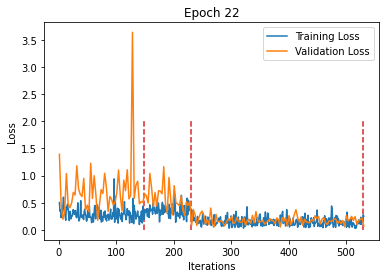

Train



Sequence:1, Seq Training Mean Loss: 0.29291870480015775, Seq Training Acc: 0.8747902684563759
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3356720957859063, Seq Training Acc: 0.8487654320987654
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.15428816869234047, Seq Training Acc: 0.9329166666666666
******************************************************************
Epoch:23, Epoch Training Loss Mean: 0.2209825962781906, Epoch Training Acc: 0.9037146226415095
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7506483720273388, Seq Valid Acc: 0.8003826530612245



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7153354899750816, Seq Valid Acc: 0.7604166666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1653171683847904, Seq Valid Acc: 0.9325
Epoch:23, Epoch Valid Mean Loss: 0.4126564860343933, Epoch Valid Acc: 0.8693181818181818
******************************************************************


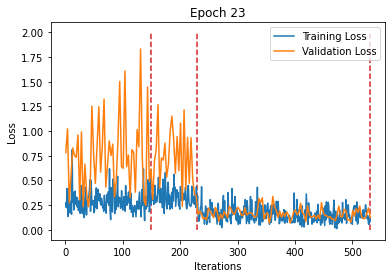

Train



Sequence:1, Seq Training Mean Loss: 0.26831503377464794, Seq Training Acc: 0.8800335570469798
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3349090343640174, Seq Training Acc: 0.8452932098765432
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.13850611231910687, Seq Training Acc: 0.9394791666666666
******************************************************************
Epoch:24, Epoch Training Loss Mean: 0.2050158530473709, Epoch Training Acc: 0.908372641509434
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6017250309185106, Seq Valid Acc: 0.8188775510204082



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6848602107277623, Seq Valid Acc: 0.7858796296296297



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.14263252027332782, Seq Valid Acc: 0.939375
Epoch:24, Epoch Valid Mean Loss: 0.3536306917667389, Epoch Valid Acc: 0.8822798295454546
******************************************************************


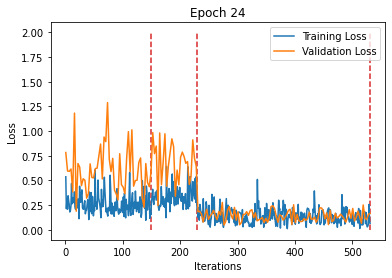

Train



Sequence:1, Seq Training Mean Loss: 0.2782820007145005, Seq Training Acc: 0.8833892617449665
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3295807459472138, Seq Training Acc: 0.8487654320987654
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.1340513609846433, Seq Training Acc: 0.9395833333333333
******************************************************************
Epoch:25, Epoch Training Loss Mean: 0.20448201894760132, Epoch Training Acc: 0.9099056603773585
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5907721489059682, Seq Valid Acc: 0.8239795918367347



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5692434951111123, Seq Valid Acc: 0.7719907407407407



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.15090000737458467, Seq Valid Acc: 0.9396875
Epoch:25, Epoch Valid Mean Loss: 0.3375420868396759, Epoch Valid Acc: 0.8817471590909091
******************************************************************


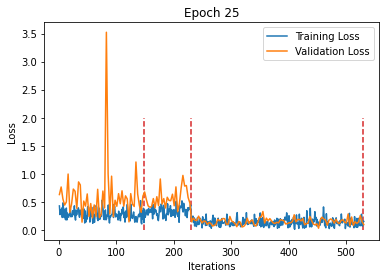

Train



Sequence:1, Seq Training Mean Loss: 0.2651470842077428, Seq Training Acc: 0.8865352348993288
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3161124802298016, Seq Training Acc: 0.8576388888888888
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.13277524859644474, Seq Training Acc: 0.940625
******************************************************************
Epoch:26, Epoch Training Loss Mean: 0.1980086714029312, Epoch Training Acc: 0.9127358490566038
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6283741395692436, Seq Valid Acc: 0.8386479591836735



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5924041309842357, Seq Valid Acc: 0.7627314814814815



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1391016798093915, Seq Valid Acc: 0.94375
Epoch:26, Epoch Valid Mean Loss: 0.3448602855205536, Epoch Valid Acc: 0.88671875
******************************************************************


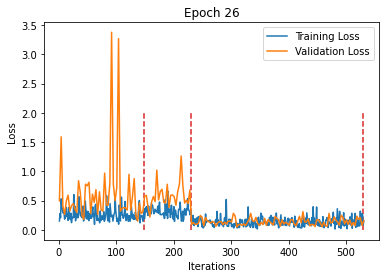

Train



Sequence:1, Seq Training Mean Loss: 0.25223745460678265, Seq Training Acc: 0.8909395973154363
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3083911168354529, Seq Training Acc: 0.8560956790123457
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.1270314059406519, Seq Training Acc: 0.9440625
******************************************************************
Epoch:27, Epoch Training Loss Mean: 0.18994809687137604, Epoch Training Acc: 0.9156839622641509
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5459387329768162, Seq Valid Acc: 0.8399234693877551



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5712785963658933, Seq Valid Acc: 0.7962962962962963



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1477103840559721, Seq Valid Acc: 0.9365625
Epoch:27, Epoch Valid Mean Loss: 0.32355996966362, Epoch Valid Acc: 0.8881392045454546
******************************************************************


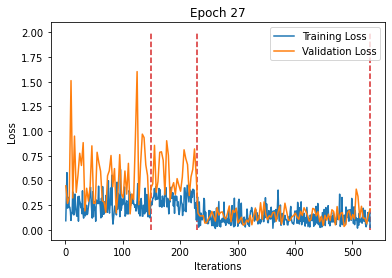

Train



Sequence:1, Seq Training Mean Loss: 0.2525153439616997, Seq Training Acc: 0.8947147651006712
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3013283509163209, Seq Training Acc: 0.8653549382716049
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.12889921904851992, Seq Training Acc: 0.9435416666666666
******************************************************************
Epoch:28, Epoch Training Loss Mean: 0.19000405073165894, Epoch Training Acc: 0.9178655660377358
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5115002557939413, Seq Valid Acc: 0.8386479591836735



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.607352222557421, Seq Valid Acc: 0.7916666666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1518495927006006, Seq Valid Acc: 0.9384375
Epoch:28, Epoch Valid Mean Loss: 0.32185783982276917, Epoch Valid Acc: 0.8881392045454546
******************************************************************


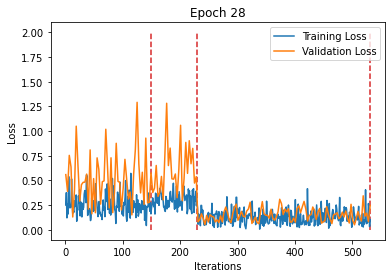

Train



Sequence:1, Seq Training Mean Loss: 0.24651020992822295, Seq Training Acc: 0.8955536912751678
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.31008122327886983, Seq Training Acc: 0.8557098765432098
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.12443592919347186, Seq Training Acc: 0.9455208333333334
******************************************************************
Epoch:29, Epoch Training Loss Mean: 0.18712712824344635, Epoch Training Acc: 0.917747641509434
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.47116267285784896, Seq Valid Acc: 0.8475765306122449



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5217490913691344, Seq Valid Acc: 0.7881944444444444



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.1476920723170042, Seq Valid Acc: 0.93875
Epoch:29, Epoch Valid Mean Loss: 0.29513299465179443, Epoch Valid Acc: 0.8902698863636364
******************************************************************


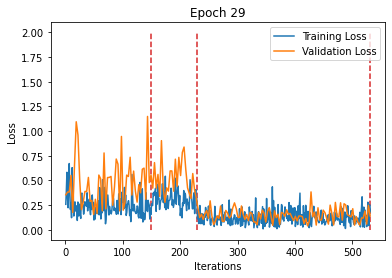

Train



Sequence:1, Seq Training Mean Loss: 0.24766547897918112, Seq Training Acc: 0.8986996644295302
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3173690911060498, Seq Training Acc: 0.8595679012345679
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.13031839169561862, Seq Training Acc: 0.9416666666666667
******************************************************************
Epoch:30, Epoch Training Loss Mean: 0.19189542531967163, Epoch Training Acc: 0.9170400943396226
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.46880497707396135, Seq Valid Acc: 0.8405612244897959



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5544850130875906, Seq Valid Acc: 0.7604166666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.14265551945194602, Seq Valid Acc: 0.941875
Epoch:30, Epoch Valid Mean Loss: 0.2966368794441223, Epoch Valid Acc: 0.8858309659090909
******************************************************************


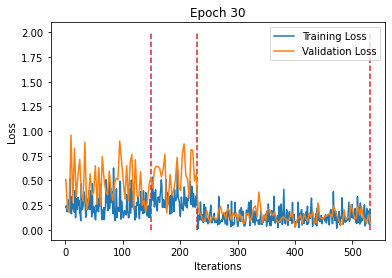


Save Model
Finished Training


In [56]:
if run_train:
    writer = SummaryWriter('runs/008_Optunav1_1stripe_lr' + str(lr) + '_' + timestampStr)
    max_iter_per_seq = 300
    # 训练迭代总步数
    num_train_iter_per_epoch = 0
    num_train_iterations = [] # For plot parting line
    num_train_iterations_per_dl = [max_iter_per_seq if len(dl)>= max_iter_per_seq else len(dl) for dl in train_dls]
    for seq_dataloaders in dataloaders:
        if len(seq_dataloaders[train_dl_idx]) <= max_iter_per_seq:
            num_train_iter_per_epoch += len(seq_dataloaders[train_dl_idx])
        else:
            num_train_iter_per_epoch += max_iter_per_seq
        num_train_iterations.append(num_train_iter_per_epoch)
    print("Total Train Iterations: ",num_train_iter_per_epoch)
    print("Total Train Iterations List: ",num_train_iterations)
        
    # 训练迭代总步数为验证迭代总步数的3倍
    num_val_iterations = [int(number / 3) for number in num_train_iterations]
    num_val_iter_per_epoch = num_val_iterations[-1]
    
    # iterations in every seq
    num_val_iter_per_seq = []
    num_val_iter_per_seq.append(num_val_iterations[0])
    for i in range(len(num_val_iterations)-1):
        diff = num_val_iterations[i+1] - num_val_iterations[i] # The latter minus the former
        num_val_iter_per_seq.append(diff)
        
    print("Valid iterations per seq: ",num_val_iter_per_seq)
        
    optimizer = torch.optim.Adam(model.parameters(),lr=lr,eps=1e-08)

    scheduler = OneCycleLR(optimizer, num_train_iter_per_epoch, num_epochs, min_lr_factor=min_lr_factor)
    scheduler.step(epoch=0)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.
    loss_min = 0.
    
    for epoch in tqdm(range(1,num_epochs+1)):

        print('Train')

        model.train()
        
        running_corrects = 0

        train_loss_array = np.zeros(num_train_iter_per_epoch, dtype=np.single)

        # mse_y = torch.zeros(batch_sizes[0]//2).to(device)
        
        i = 0
        seq_idx = 1
        for (refs, train_dl, max_num) in zip(refs_list, train_dls, num_train_iterations_per_dl):
            # obtain the refs in every seq
            
            curr_train_dl = train_dl

            curr_refs = refs.float().to(device)

            # Training
            dl_iter = iter(curr_train_dl)
            
            # This two only used to compute the loss and acc in every Sequence
            running_loss = 0
            corrects = 0
            for idx in tqdm(range(max_num)):
                if idx >= max_iter_per_seq:
                    break
                try:
                    img1, img2, targets = next(dl_iter)

                except (StopIteration, TypeError):
                    dl_iter = iter(curr_train_dl)
                    img1, img2, targets = next(dl_iter)
                
                scheduler.zero_grad()

                img1 = img1.float().to(device)
                img2 = img2.float().to(device)
                targets = targets.view(-1)
                targets = targets.float().to(device)

                # forward pass
                loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                
                loss.backward()
                
                running_loss += loss.item()
                corrects += torch.sum(preds == targets)
                running_corrects += torch.sum(preds == targets)

                train_loss_array[i] = loss.cpu().detach().numpy()
               
                
                # record loss and accuracy per iteration
                c = torch.sum(preds == targets)
                acc = int(c) / img1.size(0)
                writer.add_scalar('Train/Loss per Iteration',train_loss_array[i], ((epoch - 1) * num_train_iter_per_epoch)+ i)
                writer.add_scalar('Train/Acc per Iteration',acc, ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                # Record the lr
                curr_lr = get_lr(optimizer)
                writer.add_scalar('Train/Learning Rate',curr_lr , ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                i += 1
                scheduler.step()
            
            # record loss and accuracy in every train dataloader (namely every Sequence)
            #seq_train_mean_loss = running_loss / len(curr_train_dl)
            #seq_train_acc = int(corrects) / (len(curr_train_dl) * img1.size(0))
            seq_train_mean_loss = running_loss / max_num
            seq_train_acc = int(corrects) / (max_num * img1.size(0))
            
            print("Sequence:{}, Seq Training Mean Loss: {}, Seq Training Acc: {}".format(seq_idx, seq_train_mean_loss, seq_train_acc))
            print("******************************************************************")
            # Record the loss and acc in every Seq in Tensorboard
            writer.add_scalar('Train/Seq Training Mean Loss',seq_train_mean_loss, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Training Accuracy', seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Error Rate',1 - seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            
            seq_idx += 1
            
        # after one epoch update scheduler   
        # Plot lr policy
        curr_lr = get_lr(optimizer)
        writer.add_scalar('Train/Learning Rate Policy',curr_lr , epoch)
        writer.flush()
            
        # record loss and accuracy in every epoch (namely 6 Sequences)
        epoch_train_mean_loss = train_loss_array.mean()  # std
        epoch_train_acc = int(running_corrects) / (num_train_iter_per_epoch * img1.size(0))

        print("Epoch:{}, Epoch Training Loss Mean: {}, Epoch Training Acc: {}".format(epoch, epoch_train_mean_loss, epoch_train_acc))
        print("******************************************************************")
        
        ### Validation
        print('Validation')
        model.eval()
        val_loss_array = np.zeros(num_val_iter_per_epoch, dtype=np.single)
        
        running_corrects = 0

        i = 0
        with torch.no_grad():
            seq_idx = 1
            for (refs, valid_dl, max_num) in zip(refs_list,valid_dls, num_val_iter_per_seq):
                
                curr_valid_dl = valid_dl
                curr_refs = refs.float().to(device)
                iter_max_num = max_num
            
                dl_iter = iter(curr_valid_dl)
                # This two uesd to compute loss and accurary in every Seq
                running_loss = 0
                corrects = 0
                for dl_idx in tqdm(range(iter_max_num)):
                    try:
                        img1, img2, targets = next(dl_iter)
                    except (StopIteration, TypeError):
                        dl_iter = iter(curr_valid_dl)
                        img1, img2, targets = next(dl_iter)

                    img1 = img1.float().to(device)
                    img2 = img2.float().to(device)
                    targets = targets.view(-1)
                    targets = targets.float().to(device)
                
                    loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
                    running_loss += loss.item()
                    corrects += torch.sum(preds == targets)
                    running_corrects += torch.sum(preds == targets)
                    
                    # record loss and accuracy in every iteration
                    c = torch.sum(preds == targets)
                    acc = int(c) / img1.size(0)
                    writer.add_scalar('Validation/Loss per Iteration',loss.item(), ((epoch - 1) * num_val_iter_per_epoch)+ i)
                    writer.add_scalar('Validation/Acc per Iteration',acc, ((epoch - 1) * num_val_iter_per_epoch)+ i)

                    val_loss_array[i] = loss.cpu().detach().numpy()
                    i += 1
            
                #seq_val_mean_loss = running_loss / len(curr_valid_dl)
                #seq_val_acc = int(corrects) / (len(curr_valid_dl) * img1.size(0))
                seq_val_mean_loss = running_loss / iter_max_num
                seq_val_acc = int(corrects) / (iter_max_num * img1.size(0))
                print("******************************************************************")
                print("Sequence:{}, Seq Valid Mean Loss: {}, Seq Valid Acc: {}".format(seq_idx,seq_val_mean_loss, seq_val_acc))
                
                writer.add_scalar('Validation/Seq Mean Loss',seq_val_mean_loss, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Accuracy', seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Error Rate',1 - seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                
                seq_idx += 1
                
            epoch_val_mean_loss = val_loss_array.mean()  # std
            epoch_val_acc = int(running_corrects) / (num_val_iter_per_epoch * img1.size(0))

            print("Epoch:{}, Epoch Valid Mean Loss: {}, Epoch Valid Acc: {}".format(epoch, epoch_val_mean_loss, epoch_val_acc))
            print("******************************************************************")
            
        # save best model weights
        if epoch_val_acc > best_acc:
            best_model_wts = copy.deepcopy(model.state_dict())
            loss_min = epoch_val_mean_loss
            
        # Tensorboard
        writer.add_scalars('Epoch/Loss', {"Training Loss": epoch_train_mean_loss,
                                          "Validation Loss": epoch_val_mean_loss}, epoch)
        writer.add_scalars('Epoch/Accuracy', {"Training Accuracy":epoch_train_acc,
                                              "Validation Accuracy": epoch_val_acc}, epoch)
        writer.add_scalars('Epoch/Error Rate', {"Training": 1 - epoch_train_acc,
                                                "Validation": 1 - epoch_val_acc}, epoch)
        writer.flush()
        
        plt.plot(np.linspace(1, train_loss_array.size+1, train_loss_array.size), train_loss_array,label='Training Loss')
        plt.plot(np.linspace(1, train_loss_array.size+1, val_loss_array.size), val_loss_array, label='Validation Loss')
        
        train_parting_line = num_train_iterations  # 1128 iterations in total in training
        val_parting_line = num_val_iterations  # 373 iterations in total in validation
        plt.vlines(train_parting_line, 0, 2, colors = "tab:red", linestyles = "dashed")
        
        plt.title('Epoch {}'.format(epoch))
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
    print("Save Model")
    torch.save(model, net_path + '/m-' + timestampStr)
    torch.save({'epoch': epoch, 
                'state_dict': best_model_wts, 
                'best_loss': loss_min,
                'optimizer': optimizer.state_dict()},
                net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
    # add model to tensorboard
    #writer.add_graph(model,(img1, curr_refs, targets))
    writer.flush()

    print('Finished Training')
        

### Test Config

In [38]:
batch_size = 32
valid_dl_idx = 1
num_test_iter_per_epoch = 0
for seq_dataloaders in dataloaders:
    num_test_iter_per_epoch += len(seq_dataloaders[2])
    
model.eval()
y_vect = np.zeros(batch_size * num_test_iter_per_epoch)
y_tilde_vect = np.zeros(batch_size * num_test_iter_per_epoch)

i = 0
with torch.no_grad():
    seq_idx = 1
    
    running_corrects = 0

    test_loss_array = np.zeros(num_test_iter_per_epoch, dtype=np.single)
    
    for (refs, test_dl) in zip(refs_list,valid_dls):
        
        curr_test_dl = test_dl
        
        curr_refs = refs.float().to(device) 

        dl_iter = iter(curr_test_dl)
        
        # This two uesd to compute loss and accurary in every Seq
        running_loss = 0
        corrects = 0

        for dl_idx in tqdm(range(len(curr_test_dl))):
            try:
                img1, img2, targets = next(dl_iter)
            except (StopIteration, TypeError):
                dl_iter = iter(curr_valid_dl)
                img1, img2, targets = next(dl_iter)

            scheduler.zero_grad()
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)
            targets = targets.view(-1)
            targets = targets.float().to(device)
              
            loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
            running_loss += loss.item()
            corrects += torch.sum(preds == targets)
            
            test_loss_array[i] = loss.cpu().detach().numpy()

            y_vect[i*batch_size:(i+1)*batch_size] = targets.detach().cpu().numpy()
            y_tilde_vect[i*batch_size:(i+1)*batch_size] = preds.detach().cpu().numpy()
            
            # record loss and accuracy per iteration
            c = torch.sum(preds == targets)
            acc = int(c) / img1.size(0)
            
            writer.add_scalar('Test/Loss per Iteration',test_loss_array[i], i)
            writer.add_scalar('Test/Acc per Iteration',acc, i)
            writer.add_scalar('Test/Error Rate', 1 - acc, i)

            i += 1
        # record seq test loss and acc
        seq_test_mean_loss = running_loss / len(curr_test_dl)
        seq_test_acc = int(corrects) / (len(curr_test_dl) * img1.size(0))
        
        print("******************************************************************")
        print("Test: Sequence:{}, Seq Mean Loss: {}, Seq Acc: {}".format(seq_idx,seq_test_mean_loss, seq_test_acc))
            
        writer.add_scalar('Test/Seq Loss', seq_test_mean_loss, seq_idx)
        writer.add_scalar('Test/Seq Accuracy', seq_test_acc, seq_idx)
        writer.add_scalar('Test/Seq Error Rate', 1 - seq_test_acc, seq_idx)
        
        seq_idx += 1

writer.close()
                                      
print("Test finished")


******************************************************************
Test: Sequence:1, Seq Mean Loss: 0.42420124384213465, Seq Acc: 0.8456632653061225



******************************************************************
Test: Sequence:2, Seq Mean Loss: 0.5617301155019689, Seq Acc: 0.78125



******************************************************************
Test: Sequence:3, Seq Mean Loss: 0.15611429501957488, Seq Acc: 0.9295400943396226
Test finished


### Init test dataset for plotting degradation metrics 

In [57]:
def init_test_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5ForTest(h5_fpath, normalize_im=False, transform = composed_img_transforms)
        
        # obtain the references, the first 32 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [58]:
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "trueroi_filtered_phase2_1_{}.h5" # 2,3,4
combined_path_type2 = os.path.join(data_path_type2, fnames_type2)
seq_idx_list_type2 = [1,2,3,4]

In [ ]:
type2_data = True
if type2_data:
    # Type 2 Data New Regenerated
    data_path = "../MA/NewData/21503_1000200411_653340003"
    fnames = "regenerated_roi_ms1_seq{}_720x30.h5"

    combined_path = os.path.join(data_path, fnames)
    seq_idx_list = [1,2,3,4]

In [59]:
mean_val = 0
std_val = 255
refs_list, ds_h5_test = init_test_dataset(combined_path_type2, seq_idx_list_type2, mean_val, std_val)

In [60]:
ds_h5_test

#### init dataloader

In [61]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

### Degradation metrics function

In [62]:
def degradation_metrics(v1, refs_tensor):
    r"""Calculate distance between vector of img1&img2 and each reference images
    Args:
        v1 (Tensor, torch.Size[batchsize,128]): batch of imgs from feature extractor
        
        refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
    """
    v_dim = v1.size(1) # 128
    num_ref = refs_tensor.size(0)

    v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
    refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size
    
    kernel_matrix1 = (v11-refs).pow(2).sum(2) 
    
    metric = torch.mean(kernel_matrix1,dim = 1) 

    return metric

In [64]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []
seq_idx = 0
for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    
    time_ids.append(y_tilde_vect.size)
    mov_aver = pd.Series(y_tilde_vect).rolling(32, min_periods=1).mean()
    rel_outlier_idx = np.abs(y_tilde_vect - mov_aver) > 3
    np.save('optuna_1stripe_720x24_outlier_{}.npy'.format(seq_idx), rel_outlier_idx)
    seq_idx += 1
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

15279



7995



4322



17013


<IPython.core.display.Javascript object>


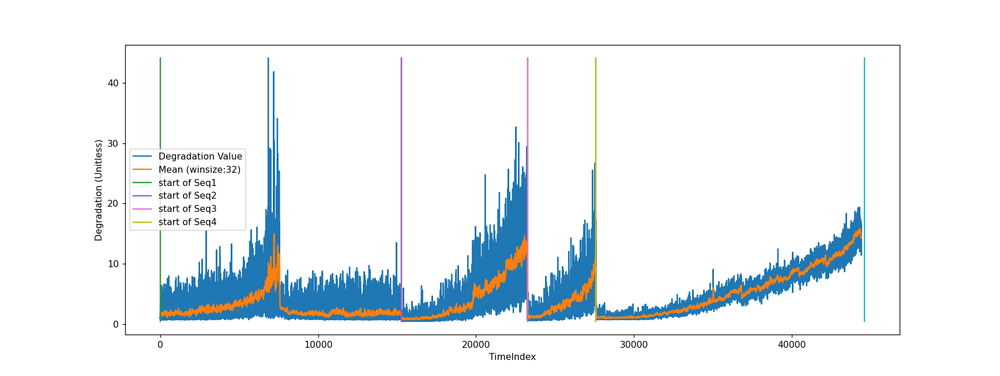

In [74]:
%matplotlib notebook
plt.plot(all_seq_y_tilde_vect[:44400], label='Degradation Value')
plt.plot(pd.Series(all_seq_y_tilde_vect[:44400]).rolling(32).mean(), label='Mean (winsize:32)')

min_y = all_seq_y_tilde_vect[:44400].min()
max_y = all_seq_y_tilde_vect[:44400].max()


# Type 2 Data
seq_period_iloc = [
    [    0,  15279],
    [ 15279, 23274],
    [ 23274, 27596],
    [ 27596, 44609],
]

seq_index = 1
for stime_iloc, etime_iloc in seq_period_iloc:
    plt.plot([stime_iloc, stime_iloc], [min_y, max_y], label = "start of Seq{}".format(seq_index))
    plt.plot([etime_iloc, etime_iloc], [min_y, max_y])
    seq_index += 1


plt.ylabel("Degradation (Unitless)")
plt.xlabel("TimeIndex")

plt.legend()
plt.show()

In [66]:
import plotly.graph_objects as go

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        name = 'Degradation Metric',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        name = 'Mean(Windowsize:32)',
        #mode='lines+markers',
    )
)

In [ ]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Create traces
trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=all_seq_y_tilde_vect,
            mode='lines',
            name = 'Degradation Metric',
            #mode='lines+markers',
            )

trace1 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
            mode='lines',
            name = 'Mean(Windowsize:32)',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

## To see the intmediate feature

In [ ]:
feature_output1 = model.feature_extractor.featuremap1.transpose(1,0).cpu()
feature_output2 = model.feature_extractor.featuremap2.transpose(1,0).cpu()
feature_output3 = model.feature_extractor.featuremapfc.transpose(1,0).cpu()
#feature_output4 = model.model.featuremap4.transpose(1,0).cpu()
#feature_output_fc = model.model.featuremapfc.transpose(1,0).cpu()
feature_output3.shape

In [ ]:
def feature_imshow(inp, title=None):
    
    """Imshow for Tensor."""
    
    inp = inp.detach().numpy().transpose((2, 1, 0))
    
    mean = np.array([0.5, 0.5, 0.5])
    
    std = np.array([0.5, 0.5, 0.5])
    
    inp = std * inp + mean
    
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(5,5))
    plt.imshow(inp)
    
    if title is not None:
        plt.title(title)
    
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
out = torchvision.utils.make_grid(feature_output3)
feature_imshow(out)

In [ ]:
dl = test_dataloaders[1]
refs = refs_list[1]

curr_refs = refs.float().to(device)
num_data = len(dl)
print(num_data)
    
loss_vect = np.zeros(num_data)
var_res_vect= np.zeros(num_data)

y_vect = np.zeros(num_data)
y_tilde_vect = np.zeros(num_data)

dl_iter = iter(dl)

for i in tqdm(range(1)):
    try:
        img,label = next(dl_iter)

    except (StopIteration, TypeError):
        dl_iter = iter(curr_train_dl)
        img,label = next(dl_iter)

    y_vect[i] = label

    img = img.float().to(device)
    
    feature_output3 = model.feature_extractor.featuremapfc.transpose(1,0).cpu()
    
    latent_vector = model.featuremap(img)
    refs_latent_vectors = model.featuremap_refs(curr_refs)
    
    output1 = latent_vector.transpose(1,0).cpu()
    output_refs = refs_latent_vectors.transpose(1,0).cpu()

    y_tilde = metric.detach().cpu().numpy()

    var_res_vect[i] = np.var(y_tilde)

    y_tilde_vect[i] = y_tilde.mean()

    loss_vect[i] = np.abs(label - y_tilde_vect[i])

In [ ]:
out = torchvision.utils.make_grid(output1)
feature_imshow(out)

In [ ]:
out = torchvision.utils.make_grid(output_refs)
feature_imshow(out)

# Load Model und Test by using several Seqs data

In [ ]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

In [ ]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []

for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs
    curr_refs = [ref.float().to(device) for ref in curr_refs]
    
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        v1, refs_v = model.forward_test(img, curr_refs)
        metric = degradation_metrics(v1,refs_v)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    time_ids.append(y_tilde_vect.size)
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

In [ ]:
fig = go.Figure()

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        #mode='lines+markers',
    )
)